### IMPORTING LIBRARIES

<font color="red"> !!!</font> This notebook requires pmdarima,and lightgbm library <font color="red"> !!!</font>

In [1]:
import random

random.seed(10)

In [2]:
import numpy as np
import pandas as pd
from scipy.stats import norm
from arch import arch_model
from scipy.stats import kstest,shapiro
import statsmodels.api as sm
from statistics import mean
from statistics import NormalDist
from statistics import variance
import math
import matplotlib.pyplot as plt  # For plotting graphs 
from datetime import datetime as dt   # To access datetime 
from pandas import Series
import collections
import seaborn as sns
import warnings                   # To ignore the warnings
warnings.filterwarnings("ignore")
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

### Train and Test Data Preprocessing

In [3]:
train_dataset = pd.read_csv("Train.csv")
test_df = pd.read_csv("Test_x.csv")

In [4]:
y=train_dataset.price  #target column
testdate=test_df['Date'] #storing test date
traindate=train_dataset["Date"] #storing train date

#removing target column so that datasets can be merged for preprocessing
train=train_dataset.drop(['price'],axis='columns')

data=pd.concat([train,test_df],axis=0)

In [5]:
data['Stock']=data['Stock'].str.replace(r'[^\d.]+', '') #removing string
data[[ "year", "month","day"]] = data["Date"].str.split("-", expand = True)


<font color="navy"> Adding conventionally used financial ratios into our datasets </font>

In [6]:
data["current_ratio"]=data['current_assets']/data['current_liabilities']
data['Dividend_payout']=data['dividend']/data['net_income']
data['Debt2equity_ratio']=data['liabilities']/data['equity']

In [7]:
data=data.drop(['Date','day'],axis='columns')

In [8]:
data['year']=data['year'].astype(int)
data['month']=data['month'].astype(int)
data['Stock']=data['Stock'].astype(int)
data

,Stock,liabilities,equity,total_assets,current_assets,current_liabilities,total_revenue,net_income,dividend,shares_outstanding,year,month,current_ratio,Dividend_payout,Debt2equity_ratio
0,1,625.898686,925.086518,1550.985204,675.789905,555.931329,548.488451,251.282553,68.184030,1040831,2006,7,1.215600,0.271344,0.676584
1,1,407.387467,903.249093,1310.636561,1023.110983,1295.186240,513.446432,207.576940,42.232672,1046649,2006,8,0.789933,0.203456,0.451024
2,1,464.069891,602.668832,1066.738722,709.711673,598.719338,503.519871,133.719700,28.835722,1094158,2006,9,1.185383,0.215643,0.770025
3,1,855.854937,391.375369,1247.230306,649.979564,733.594339,596.006397,-76.881818,0.000000,1018574,2006,10,0.886020,-0.000000,2.186788
4,1,453.954969,956.490566,1410.445534,1115.594551,1152.274711,965.939247,-309.204301,0.000000,1036293,2006,11,0.968167,-0.000000,0.474605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,100,408.766312,440.569040,849.335352,348.102723,312.827547,150.677789,-3.197117,0.000000,1028799,2022,10,1.112762,-0.000000,0.927814
4996,100,492.923805,731.542040,1224.465846,915.110188,892.471680,529.905187,148.531273,30.964416,1004215,2022,11,1.025366,0.208471,0.673815
4997,100,392.331633,705.422815,1097.754448,353.436744,420.021023,963.856236,-19.214152,0.000000,1005944,2022,12,0.841474,-0.000000,0.556165
4998,100,273.102651,817.198302,1090.300953,787.193836,962.158503,437.654297,13.658068,3.390605,1028097,2023,1,0.818154,0.248249,0.334194


In [9]:
# Separating  test and train dataset
train=data.iloc[:15000,:]
test=data.iloc[15000:,:]
X=train.copy() #making a copy for additional manipulations


Making csv of preprocessed train dataset for future uses 

In [10]:
X['Date']=traindate
X['price']=y
X=X.drop(["year","month"],axis=1)
preprocessed_train_df=X

## MODEL ARCHITECTURE

Generated simulations of Geometric Brownian Motion (GBM) with a mean equal to the mean of the training data for a specific stock and  variance equals to 0.05. From these simulations, I selected the simulation that best fit the training data for that stock. I determined the best fit simulation by comparing the mean squared error (MSE) between the simulated prices and the prices from the training data. If the RMSE between the simulation and training data prices was less than 3.0, I considered that simulation as the best fit for the particular stock.

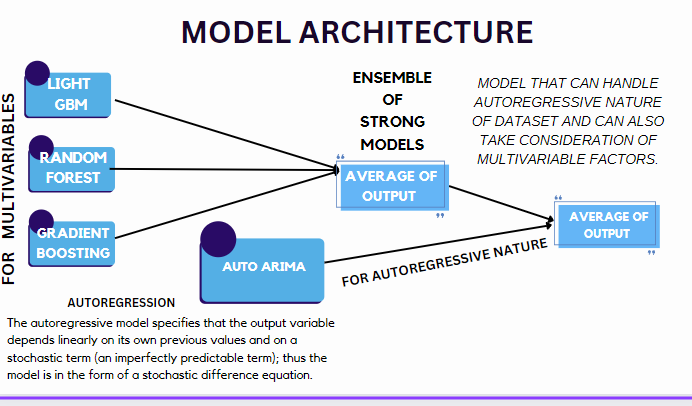

### Coorelation plot : Why not Regression models?

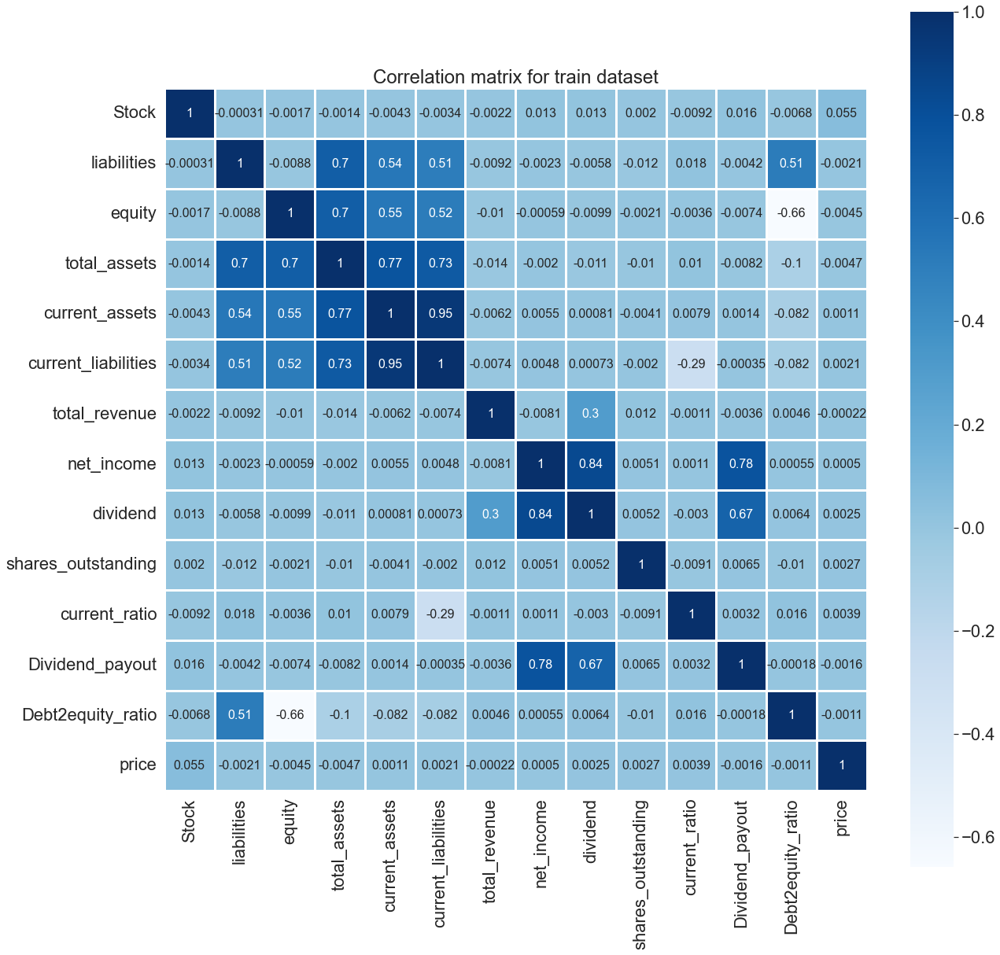

In [13]:
trainDF=preprocessed_train_df
trainDF['Date']=pd.to_datetime(trainDF['Date'])
fig, ax1 = plt.subplots(1, 1, figsize=(20,20))
sns.set(font_scale = 2)
dataplot = sns.heatmap(trainDF.corr(),ax=ax1, cmap='Blues', annot=True,annot_kws={'fontsize':16},linewidth=3,linecolor='w', square=True)
plt.title("Correlation matrix for train dataset")
plt.show()

##### <font color="navy"> Since no correlation exists between "price" and other columns, simple regression models will not be of much use.</font>

### Plot to show Prices of 100 stocks (train dataset)

..........................................................


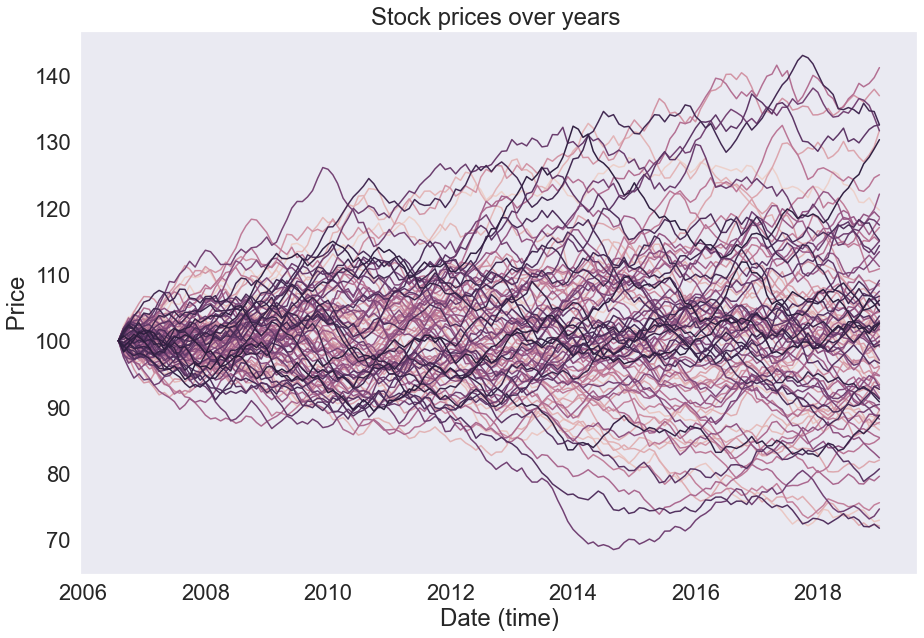

In [14]:
print("..........................................................")
sns.set_style("dark")
sns.set(font_scale = 2)
fig,ax=plt.subplots(1,1,figsize=(15,10))
sns.lineplot(data=trainDF, x='Date',y='price',hue='Stock',legend=False)
plt.grid()
plt.xlabel("Date (time)")
plt.ylabel(" Price ")
plt.title("Stock prices over years ")
plt.show()

### Plot to show 100 simulations of geometric brownian motion

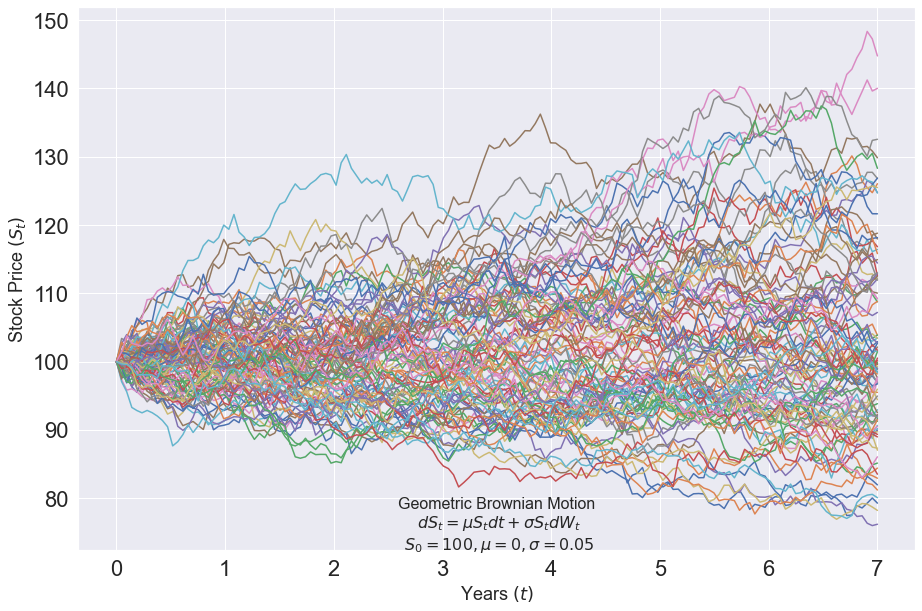

In [15]:

# Parameters
# drift coefficent
mu = 0
# number of steps
n = 149
# time in years
T = 7
# number of simulations
M = 100
# initial stock price
S0 = 100
# volatility
sigma = 0.05
# calc each time step
dt = T/n
# simulation using numpy arrays
St = np.exp(
    (mu - sigma ** 2 / 2) * dt
    + sigma * np.random.normal(0, np.sqrt(dt), size=(M,n)).T
)

St = np.vstack([np.ones(M), St])
# multiply through by S0 and return the cumulative product of elements along a given simulation path (axis=0). 
St = S0 * St.cumprod(axis=0)
# Define time interval 
time = np.linspace(0,T,n+1)
# Require numpy array that is the same shape as St
tt = np.full(shape=(M,n+1), fill_value=time).T
fig,ax=plt.subplots(1,1,figsize=(15,10))
plt.plot(tt, St)
plt.xlabel("Years $(t)$",fontsize=18)
plt.ylabel("Stock Price $(S_t)$",fontsize=18)
plt.title("Geometric Brownian Motion\n $dS_t = \mu S_t dt + \sigma S_t dW_t$\n $S_0 = {0}, \mu = {1}, \sigma = {2}$".format(S0, mu, sigma),y=-0.01,fontsize=16)
plt.show()

## Training Ensemble  Models

#### Train-Test split

In [16]:
X_train, X_test, y_train, y_test = train_test_split(train, y, test_size = 0.1)

### Random Forest

In [17]:
randomforest = RandomForestRegressor(n_estimators = 70, random_state = 0)
 
# fit the regressor with x and y data
randomforest.fit(X_train, y_train) 

print("Accuracy of Random Forest : "+str(randomforest.score(X_test,y_test)))
y_pred = randomforest.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root mean Squared error : "+ str(rmse))

Accuracy of Random Forest : 0.9640715994813379
Root mean Squared error : 1.9501818649975518


In [18]:
#Storing Output
output_price1=randomforest.predict(test)

### LightGBM

In [19]:
#if lightGBM is not installed in your PC , please run the below code after commenting out.

#!pip install lightgbm

In [20]:
from lightgbm import LGBMRegressor

lgbm = LGBMRegressor(random_state=5)

lgbm.fit(X_train, y_train)
print("Accuracy of LightGBM : "+str(lgbm.score(X_test,y_test)))

y_pred = lgbm.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root mean Squared error : "+ str(rmse))

Accuracy of LightGBM : 0.8700666556320372
Root mean Squared error : 3.708655389517884


In [21]:
#Storing Output
output_price2=lgbm.predict(test)

### Gradient Boosting

In [22]:
gradboost = GradientBoostingRegressor(n_estimators=500, learning_rate=0.10, max_depth=10,random_state=11)

gradboost.fit(X_train, y_train)
print("Accuracy of Gradient Boosting : "+str(gradboost.score(X_test,y_test)))

y_pred = gradboost.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root mean Squared error : "+ str(rmse))

Accuracy of Gradient Boosting : 0.957608813312216
Root mean Squared error : 2.118331669030412


In [23]:
#Storing Output
output_price3=gradboost.predict(test)

#### Combining Models predictions together by taking average of them

In [27]:
test

,Stock,liabilities,equity,total_assets,current_assets,current_liabilities,total_revenue,net_income,dividend,shares_outstanding,year,month,current_ratio,Dividend_payout,Debt2equity_ratio
0,1,777.137456,411.991482,1189.128938,735.376019,834.292436,101.282767,44.303576,12.430562,1038979,2019,1,0.881437,0.280577,1.886295
1,1,277.194579,499.621626,776.816206,462.172266,447.906629,119.483578,19.410210,4.298036,1033350,2019,2,1.031850,0.221432,0.554809
2,1,496.436651,372.604918,869.041569,529.266640,683.167288,482.381171,-47.940167,0.000000,1093455,2019,3,0.774725,-0.000000,1.332341
3,1,484.533101,809.661340,1294.194441,412.770236,350.779135,570.934617,121.963652,31.066241,1047609,2019,4,1.176724,0.254717,0.598439
4,1,290.520190,715.758617,1006.278807,802.761555,892.693784,277.522337,-78.316857,0.000000,1042163,2019,5,0.899257,-0.000000,0.405891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,100,408.766312,440.569040,849.335352,348.102723,312.827547,150.677789,-3.197117,0.000000,1028799,2022,10,1.112762,-0.000000,0.927814
4996,100,492.923805,731.542040,1224.465846,915.110188,892.471680,529.905187,148.531273,30.964416,1004215,2022,11,1.025366,0.208471,0.673815
4997,100,392.331633,705.422815,1097.754448,353.436744,420.021023,963.856236,-19.214152,0.000000,1005944,2022,12,0.841474,-0.000000,0.556165
4998,100,273.102651,817.198302,1090.300953,787.193836,962.158503,437.654297,13.658068,3.390605,1028097,2023,1,0.818154,0.248249,0.334194


In [28]:
test_df=test.drop(["year",'month'],axis=1)
test_df['Date']=testdate

#taking averge of all the three models output
output_price=[(x+y+z)/3 for x,y,z in zip(output_price1,output_price2,output_price3)]
test_df['price']=output_price

#Creating CSV file to store output for convienient future uses
tcsv=test_df.to_csv("Ensemble_prediction_output.csv",index=False)

### Performing ADF Test

In [29]:
#Reading preprocessed train dataset
train_df =preprocessed_train_df
train_df['Date']=pd.to_datetime(train_df['Date'])
train_df=train_df.set_index('Date')

In [30]:
Stock_test_passed={}
for i in range(1,101):
    # filtering dataset Stock wise
    df = train_df[train_df['Stock'].astype(int) == i]
    values = df['price']

    # Perform ADF test
    result = adfuller(values)

    # Extract the p-value
    p_value = result[1]
    
    if p_value < 0.05:
        Stock_test_passed[i]=0  
    else:
        for j in range(1,11):
            diff_lag=abs(df['price'].diff(periods=j).dropna())
            result2=adfuller(diff_lag)
            p_v=result2[1]
            if(p_v<0.05):
                Stock_test_passed[i]=j  #i: stock ,j : number of lags it took to pass the test
                break

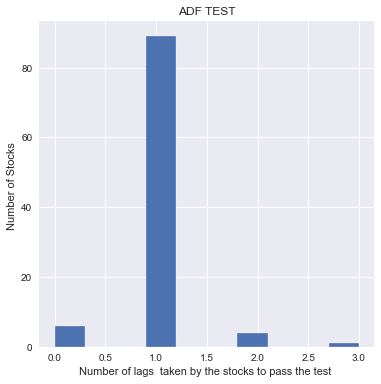

In [31]:
plt.style.use("seaborn")
fig,ax=plt.subplots(1,1,figsize=(6,6))
plt.hist(Stock_test_passed.values())
plt.title("ADF TEST")
plt.xlabel("Number of lags  taken by the stocks to pass the test ")
plt.ylabel("Number of Stocks ")
plt.show()

## Training Auto ARIMA 

In [35]:
output=pd.read_csv("Ensemble_prediction_output.csv",parse_dates=['Date'])
output['price_arima']=None
output["price_avg"]=None
for i in range(1,101):
    df = train_df[train_df['Stock'].astype(int) ==i]
    values = df['price']
    df_output=pd.read_csv("Ensemble_prediction_output.csv",parse_dates=['Date'])
    dfo=df_output[df_output['Stock'].astype(int) ==i]
    x=dfo.index
    d_value=Stock_test_passed[i]
    import pmdarima as pm
    model = pm.auto_arima(values, 
                            m=12, seasonal=False,
                          start_p=8, max_p=15,start_q=2,max_q=15 ,max_order=30, d=d_value,test='adf',error_action='trace', 
                          random=True, 
                               suppress_warnings=True,
                          stepwise=True, trace=True)

    model_fit = model.fit(values)
    forecast_values1 = model_fit.predict(50)
    output['price_arima'][output['Stock'].astype(int) ==i]=forecast_values1
    # Evaluate model performance (optional)
    
    p=dfo['price']
    avg_o=[(x+y)/2 for x,y in zip(p,forecast_values1)]
    output['price_avg'][output['Stock'].astype(int) ==i]=avg_o
   

Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=406.627, Time=1.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=404.554, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=398.676, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=397.424, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=405.545, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=399.409, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=399.398, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=397.772, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=397.496, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 2.305 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=396.578, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=409.936, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=392.934, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=395.574, Time=0

 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=368.548, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=369.521, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=367.112, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=364.428, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=367.543, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=362.062, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=363.249, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=363.137, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=361.144, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=363.139, Time=0.06 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=365.127, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=359.169, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=362.447, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=361.162, Time=0.11 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=361.164, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]  

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=352.674, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=353.986, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=349.568, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=350.292, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=350.682, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=354.741, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=351.995, Time=0.08 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.286 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=346.181, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=341.930, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=336.696, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=337.967, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=348.919, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=337.955, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept  

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=396.534, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=392.635, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=394.603, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=394.603, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=395.416, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.21 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.400 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=384.381, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=374.276, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=376.659, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=382.382, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=374.704, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=374.0

Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=369.491, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=384.725, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=360.214, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=360.639, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=382.748, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=360.305, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=360.925, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=358.214, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=358.307, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=358.926, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=358.644, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=357.454, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=360.095, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=359.922, 

 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=373.094, Time=0.21 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=363.307, Time=0.18 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=366.682, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=368.024, Time=0.09 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(3,1,3)(0,0,0)[0]             : AIC=366.417, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=369.870, Time=0.06 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=368.511, Time=0.13 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=371.134, Time=0.13 sec
 ARIMA(4,1,3)(0,0,0)[0]             : AIC=365.727, Time=0.40 sec

Best model:  ARIMA(3,1,2)(0,0,0)[0]          
Total fit time: 7.601 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=386.222, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=361.207, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=356.625, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=355.042, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=357.076, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=353.086, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=353.224, Time=0.02 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=354.229, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=354.756, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=353.174, Time=0.08 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=355.218, Time=0.15 sec

Best model:  ARIMA(2,1,0)(0,0,0)[0]          
Total fit time: 1.707 seconds
Performing stepwise search to minimize aic
 ARIMA(8,0,2)(0,0,0)[0]             : AIC=328.221, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1772.268, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.04 sec
 ARIMA(7,0,2)(0,0,0)[0]             : AIC=

Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=344.156, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=340.649, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=330.889, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=330.830, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=338.649, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=332.577, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=332.550, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=334.550, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=328.834, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=330.582, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=330.555, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=328.895, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=332.555, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.338 seconds
Performing stepwise search to minim

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.16 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.149 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=381.350, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=374.620, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=368.130, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=369.415, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=372.624, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=369.677, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=369.781, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=371.249, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=366.133, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=367.681, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=367.785, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=367.418, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : A

 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=350.286, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=351.883, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=347.260, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=348.975, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=349.115, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=347.217, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=349.091, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=350.482, Time=0.07 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.252 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=437.689, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=442.057, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=429.974, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=432.981, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=446.006, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept  

 ARIMA(8,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=405.896, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=395.547, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=379.416, Time=0.06 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=403.906, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=377.416, Time=0.04 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=359.223, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=393.551, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=361.143, Time=0.10 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=361.130, Time=0.10 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=361.036, Time=0.06 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=385.431, Time=0.02 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=360.503, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=362.290, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=357.093, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=358.936, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=358.982, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=359.231, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=360.763, Time=0.06 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 1.303 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=402.683, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=406.997, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=398.415, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=398.279, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=405.000, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=400.270, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept  

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=402.938, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=401.816, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=410.642, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=402.520, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=402.510, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=402.950, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=406.666, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=402.304, Time=0.04 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=402.623, Time=0.17 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0]          
Total fit time: 2.004 seconds
Performing stepwise search to minimize aic
 ARIMA(8,1,2)(0,0,0)[0] intercept   : AIC=363.265, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=358.185, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=351.218, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=351.233, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]            

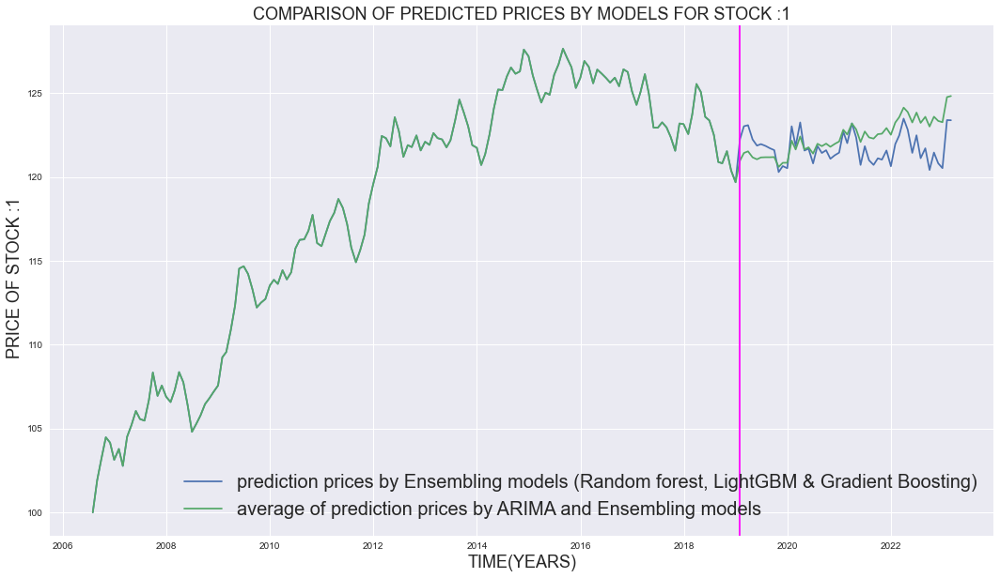

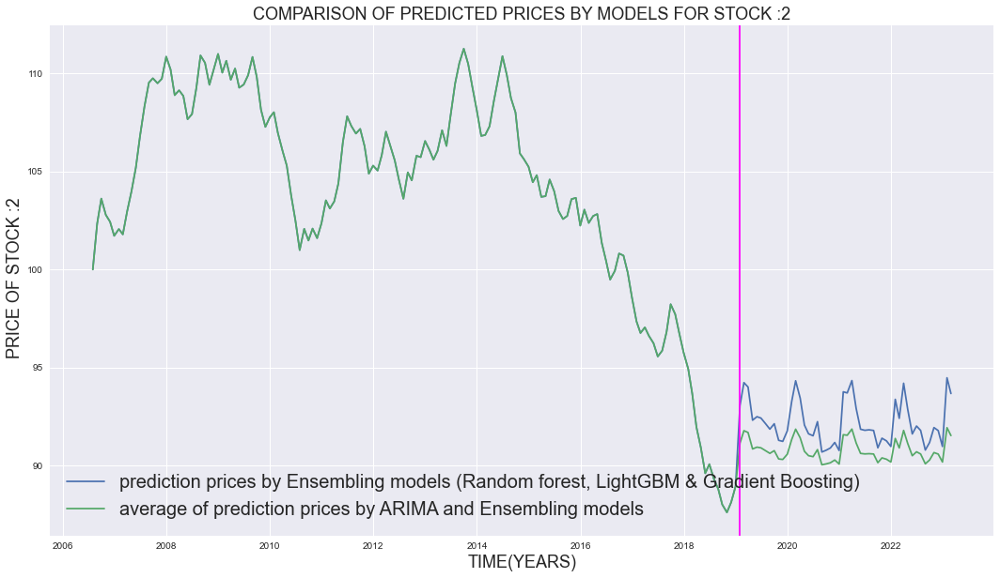

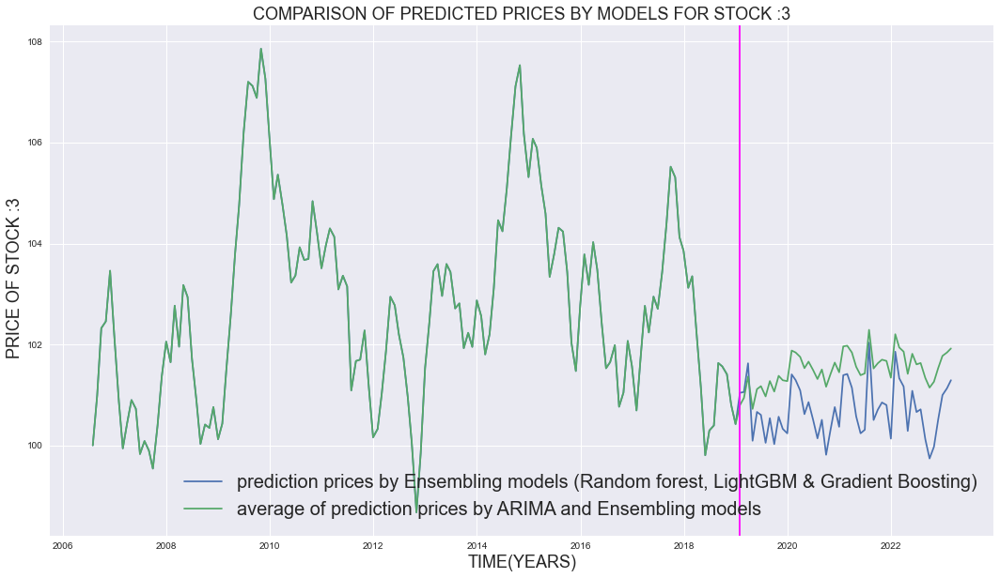

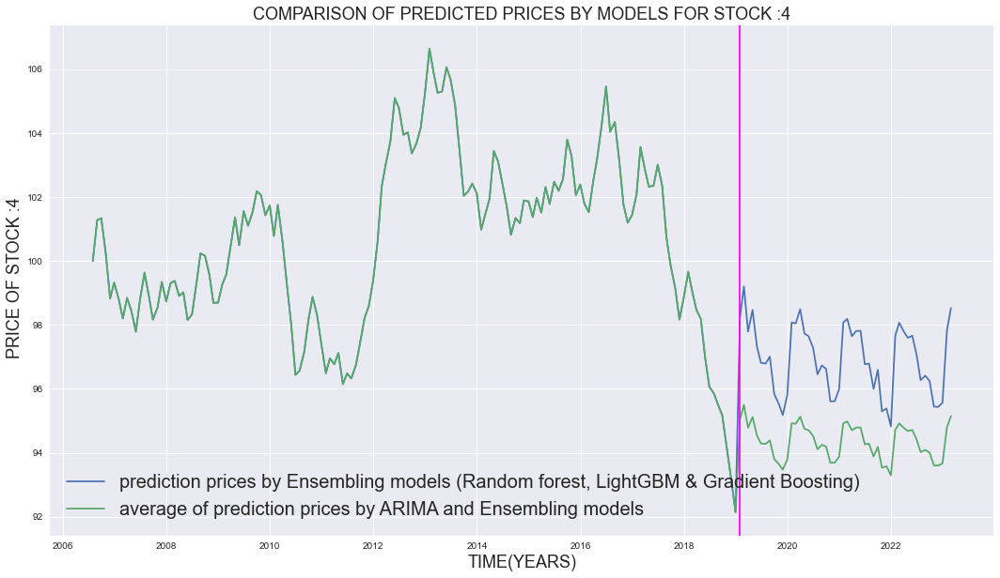

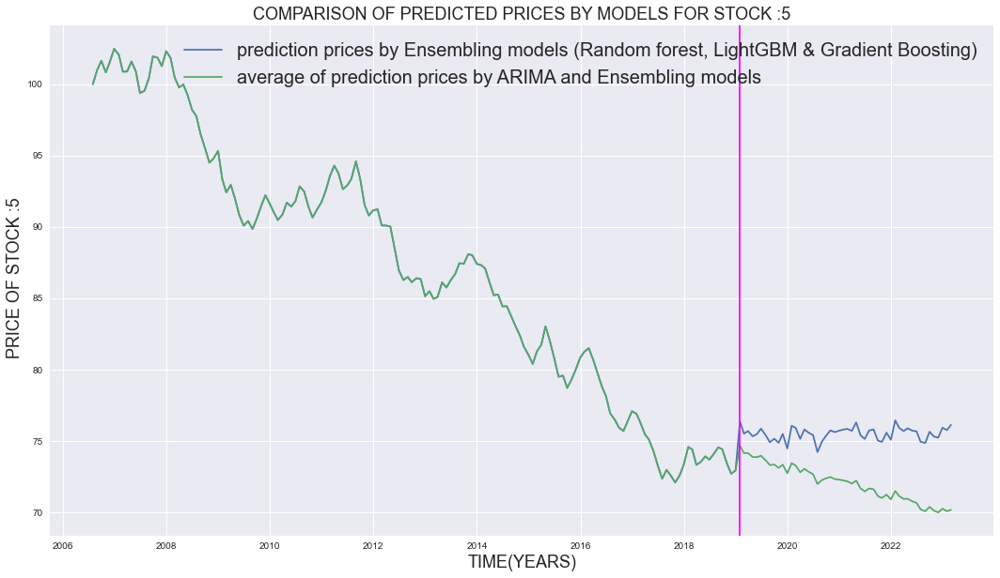

...

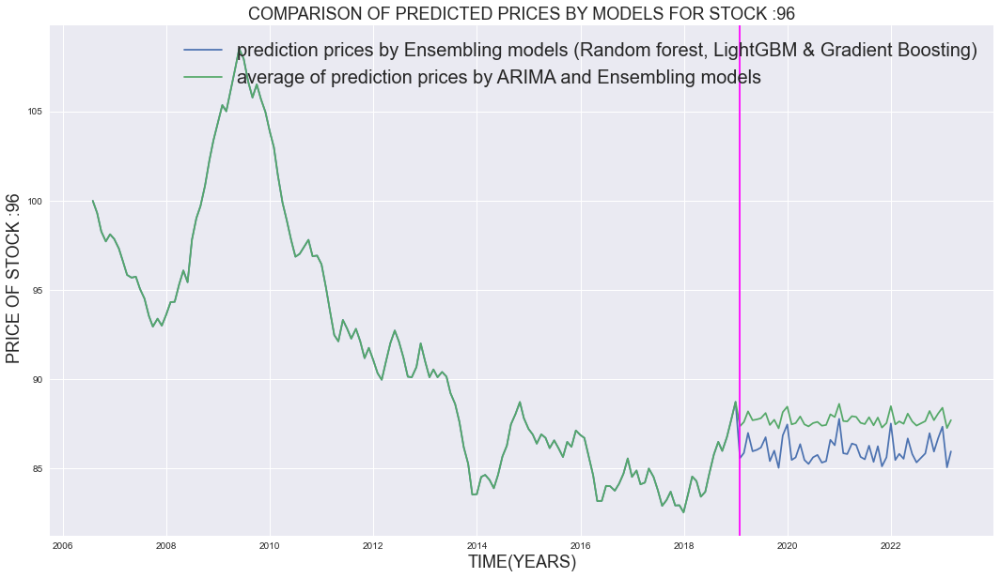

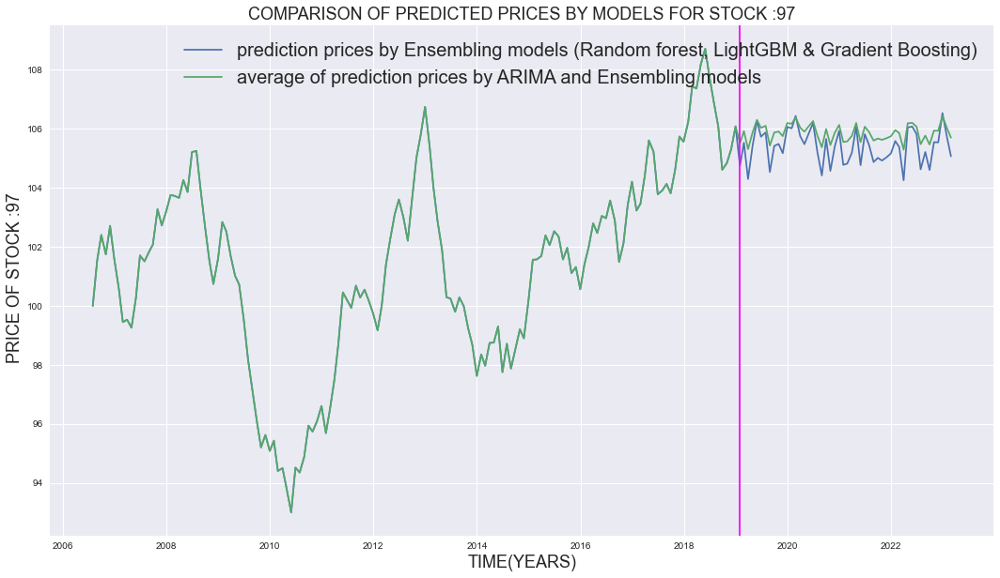

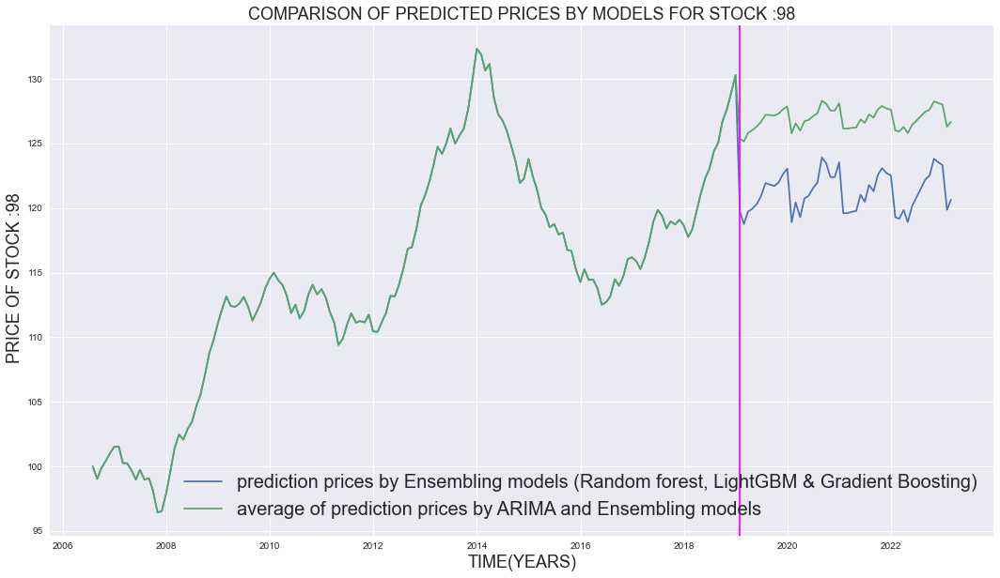

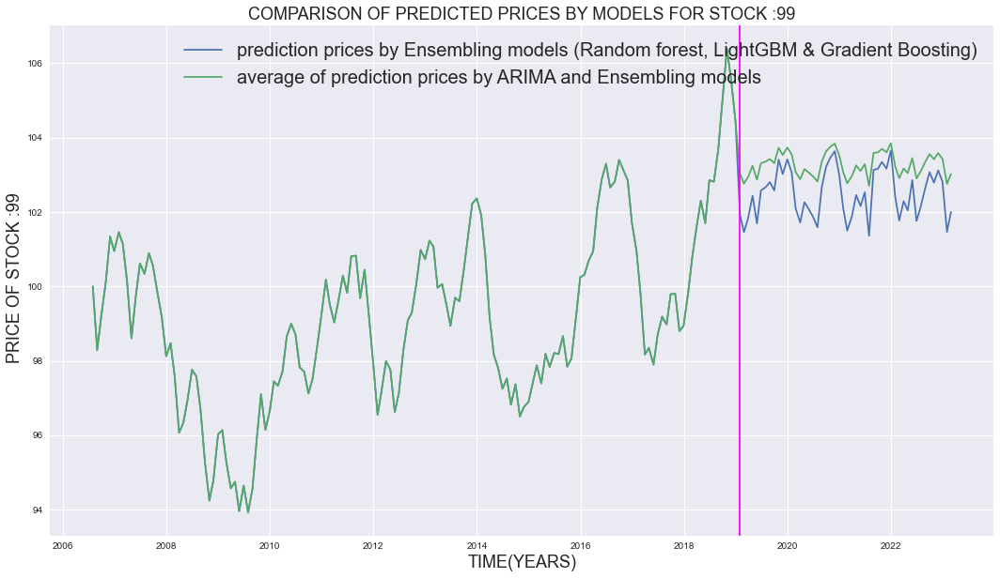

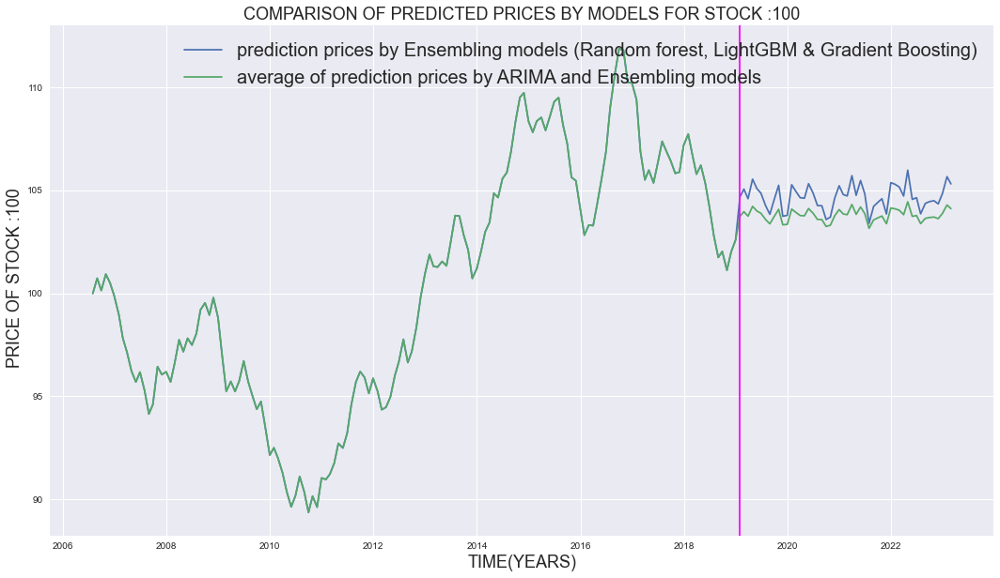

In [40]:
from datetime import datetime as dt   # To access datetime 
train_df = preprocessed_train_df
train_df['Date']=pd.to_datetime(train_df['Date'])

output["PRICE"]=None
for i in range(1,101):
    test_avg=output["price_avg"][output['Stock'].astype(int) ==i]
    test_ensemble=output["price"][output['Stock'].astype(int) ==i]

    output["PRICE"][output['Stock'].astype(int) ==i]=test_avg
    
    train_price = train_df['price'][train_df['Stock'].astype(int) ==i]
    date1=train_df['Date'][train_df['Stock'].astype(int) ==i]
    date2=output['Date'][output['Stock'].astype(int) ==i]
    date=np.concatenate((date1, date2), axis=None) 
    price_ensemble=np.concatenate((train_price,test_ensemble),axis=None)
    price_avg=np.concatenate((train_price,test_avg),axis=None)
    

    plt.style.use("seaborn")
    fig,ax=plt.subplots(1,1,figsize=(18,10))
   
    plt.plot(date,price_ensemble,label="prediction prices by Ensembling models (Random forest, LightGBM & Gradient Boosting)")
    plt.plot(date,price_avg,label="average of prediction prices by ARIMA and Ensembling models")
    
    plt.axvline(dt(2019, 1, 31), color='magenta')
    plt.xlabel("TIME(YEARS)",fontsize=18)
    plt.ylabel(" PRICE OF STOCK :"+ str(i),fontsize=18)
    plt.title("COMPARISON OF PREDICTED PRICES BY MODELS FOR STOCK :"+str(i),fontsize=18)
    plt.legend(fontsize=20)
    plt.show()

#### Creating final submission csv

In [41]:
output_data=output[['Date',"Stock","PRICE"]]

In [42]:
#storing final prediction output, combining ARIMA's predictions with Ensembling models predictions of prices.
predictions=output_data.to_csv("final_submission_output.csv",index=False)